In [ ]:
import os

In [3]:
import glob

In [4]:
from IPython.display import Image, display

In [5]:
!nvidia-smi

Tue Nov 11 07:59:07 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
HOME = os.getcwd()

In [ ]:
print(HOME)

/content


In [ ]:
!pip install ultralytics

In [ ]:
import ultralytics

In [ ]:
ultralytics.checks()

Ultralytics 8.3.227 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.5/112.6 GB disk)


In [ ]:
!mkdir {HOME}/datasets

mkdir: cannot create directory ‘/content/datasets’: File exists


In [ ]:
%cd {HOME}/datasets

/content/datasets


In [ ]:
!pip install roboflow

In [ ]:
!pip install fastapi kaleido python_multipart uvicorn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 4.1 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/potholedetection

test  train


In [ ]:
data_yaml = """
train: /content/drive/MyDrive/potholedetection/train
val: /content/drive/MyDrive/potholedetection/test

nc: 1
names: ['pothole']
"""

with open('/content/drive/MyDrive/potholedetection/data.yaml', 'w') as f:
    f.write(data_yaml)

print("✅ data.yaml file created successfully!")

✅ data.yaml file created successfully!


In [ ]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8m.pt data=/content/drive/MyDrive/potholedetection/data.yaml epochs=70 imgsz=640


/content
Ultralytics 8.3.227 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/potholedetection/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, persp

In [ ]:
!ls {HOME}//runs/detect/train

args.yaml			 results.csv	      val_batch0_labels.jpg
BoxF1_curve.png			 results.png	      val_batch0_pred.jpg
BoxP_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
BoxPR_curve.png			 train_batch1.jpg     val_batch1_pred.jpg
BoxR_curve.png			 train_batch2.jpg     val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch5880.jpg  val_batch2_pred.jpg
confusion_matrix.png		 train_batch5881.jpg  weights
labels.jpg			 train_batch5882.jpg


/content


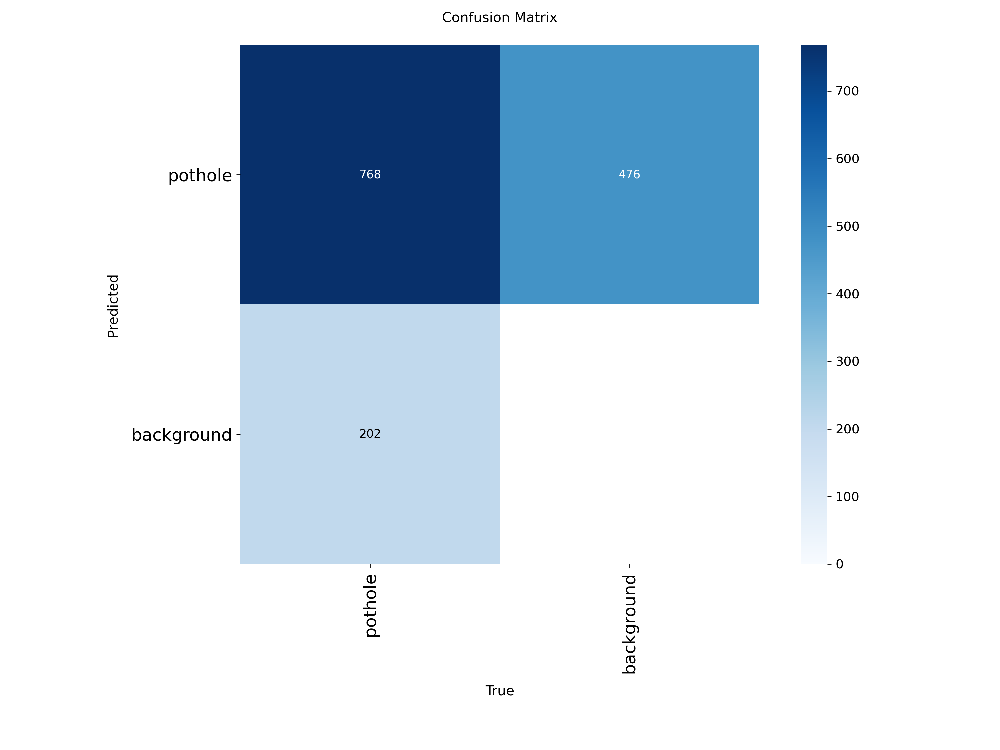

In [ ]:
%cd {HOME}

Image(filename = f'{HOME}/runs/detect/train/confusion_matrix.png', width = 900)

/content


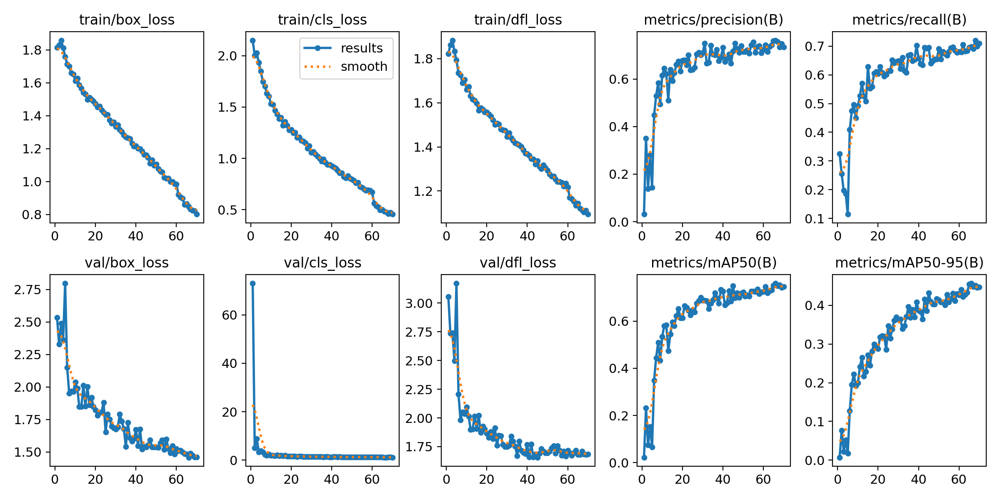

In [ ]:
%cd {HOME}

Image(filename = f'{HOME}/runs/detect/train/results.png', width = 600)

/content


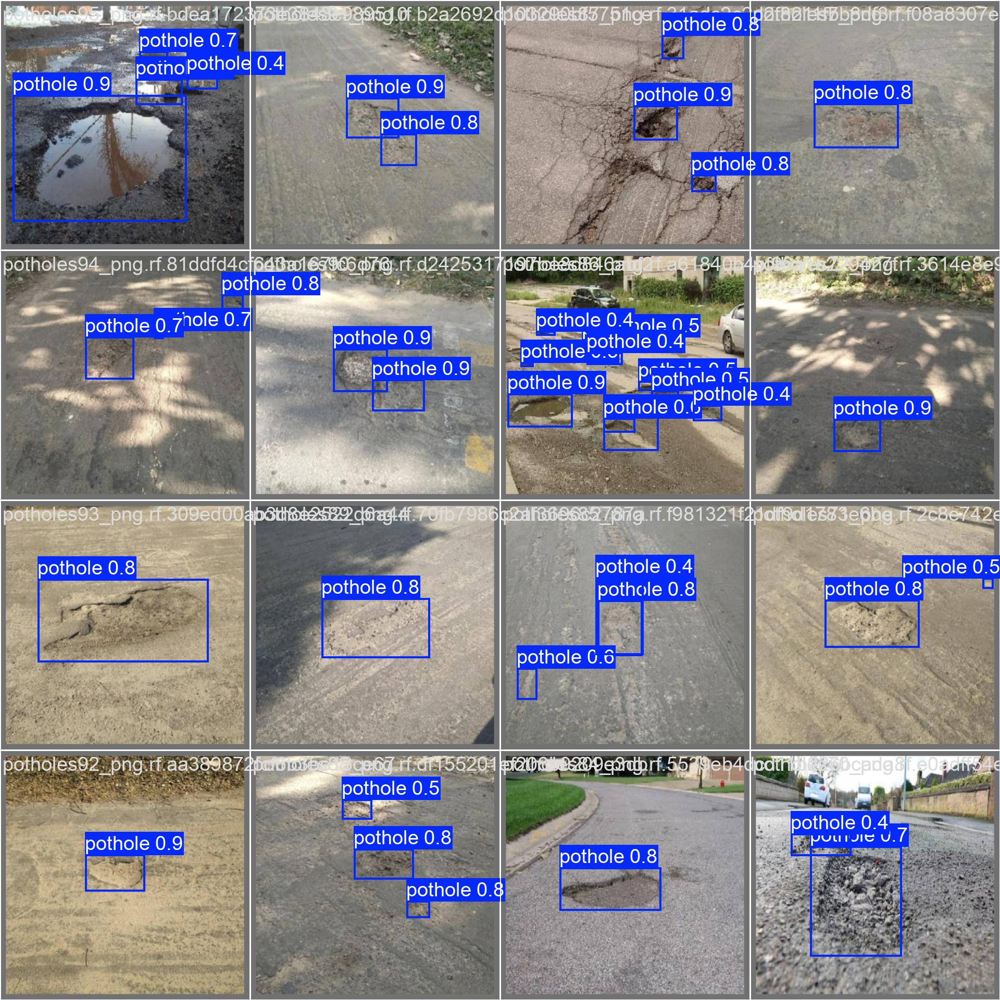

In [ ]:
%cd {HOME}

Image(filename = f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width = 600)

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data=/content/drive/MyDrive/potholedetection/data.yaml

/content
Ultralytics 8.3.227 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 16.6±3.4 MB/s, size: 28.2 KB)
val: Scanning /content/drive/MyDrive/potholedetection/test.cache... 421 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 421/421 6.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 27/27 2.0it/s 13.8s
                   all        421        970      0.762      0.698      0.761      0.457
Speed: 2.2ms preprocess, 19.8ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/runs/detect/val2
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/drive/MyDrive/potholedetection/test

/content
Ultralytics 8.3.227 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs

image 1/421 /content/drive/MyDrive/potholedetection/test/01_jpg.rf.3ca97922642224c05e3602b324e899f2.jpg: 640x640 2 potholes, 37.1ms
image 2/421 /content/drive/MyDrive/potholedetection/test/02_jpg.rf.fd1071cccf6104bead7ea605f33c1f8d.jpg: 640x640 1 pothole, 36.9ms
image 3/421 /content/drive/MyDrive/potholedetection/test/03_jpg.rf.e6dab082007ac382ad648a0f055105ca.jpg: 640x640 1 pothole, 36.9ms
image 4/421 /content/drive/MyDrive/potholedetection/test/04_jpg.rf.a84df1061f7aba882275f3dff0c3c8d4.jpg: 640x640 1 pothole, 36.9ms
image 5/421 /content/drive/MyDrive/potholedetection/test/05_jpg.rf.15f9104af0172866d03e1a19370c13b1.jpg: 640x640 1 pothole, 32.9ms
image 6/421 /content/drive/MyDrive/potholedetection/test/06_jpg.rf.e731e1e4a1bbb1f5d9cf3c472683ab9f.jpg: 640x640 2 potholes, 24.2ms
image 7/421 /content/drive/MyDrive/po

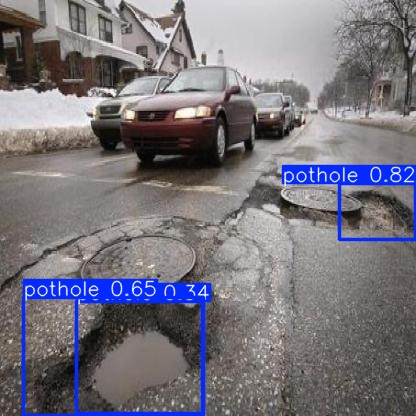

In [ ]:
Image('/content/runs/detect/predict/potholes643_png.rf.e9e7a842501e7471e53a602d0aca16a4.jpg')

In [ ]:
%cd {HOME}

!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source='/content/drive/MyDrive/potholedetection/sample_video.mp4'

/content
Ultralytics 8.3.227 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs

video 1/1 (frame 1/375) /content/drive/MyDrive/potholedetection/sample_video.mp4: 384x640 15 potholes, 58.9ms
video 1/1 (frame 2/375) /content/drive/MyDrive/potholedetection/sample_video.mp4: 384x640 14 potholes, 25.0ms
video 1/1 (frame 3/375) /content/drive/MyDrive/potholedetection/sample_video.mp4: 384x640 16 potholes, 25.0ms
video 1/1 (frame 4/375) /content/drive/MyDrive/potholedetection/sample_video.mp4: 384x640 15 potholes, 25.0ms
video 1/1 (frame 5/375) /content/drive/MyDrive/potholedetection/sample_video.mp4: 384x640 13 potholes, 25.0ms
video 1/1 (frame 6/375) /content/drive/MyDrive/potholedetection/sample_video.mp4: 384x640 13 potholes, 25.0ms
video 1/1 (frame 7/375) /content/drive/MyDrive/potholedetection/sample_video.mp4: 384x640 12 potholes, 24.4ms
video 1/1 (frame 8/375) /content/drive/MyDrive/potholed

In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload your pothole video


Saving sample_video.mp4 to sample_video (1).mp4


In [ ]:
save_path = '/content/sample_video.mp4'
compressed_path = '/content/compressed_video.mp4'

In [ ]:
!ffmpeg -i "{save_path}" -vcodec libx264 -crf 28 "{compressed_path}"

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
import os
if os.path.exists(compressed_path):
    print("Compression successful!")
else:
    print("Compression failed.")


Compression successful!


In [ ]:
from IPython.display import HTML
from base64 import b64encode

# Path to your compressed video
compressed_path = "/content/compressed_video.mp4"

# Read the video and encode it
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

# Display inline
HTML(f"""
<video width="640" height="480" controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")


In [ ]:
!ls /content/runs/detect/



predict  predict2  train  val  val2


In [ ]:
!ls /content/runs/detect/predict2/


sample_video.avi


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict2/sample_video.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""<video width="640" height="480" controls>
    <source src="{data_url}" type="video/mp4">
</video>""")
